<a href="https://colab.research.google.com/github/suazojaime/Solutions_food_sales/blob/main/Project_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', None)
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
df = pd.read_csv('sales_predictions.csv')

In [3]:
df

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.300,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.920,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.500,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.200,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.930,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052
...,...,...,...,...,...,...,...,...,...,...,...,...
8518,FDF22,6.865,Low Fat,0.056783,Snack Foods,214.5218,OUT013,1987,High,Tier 3,Supermarket Type1,2778.3834
8519,FDS36,8.380,Regular,0.046982,Baking Goods,108.1570,OUT045,2002,NaN,Tier 2,Supermarket Type1,549.2850
8520,NCJ29,10.600,Low Fat,0.035186,Health and Hygiene,85.1224,OUT035,2004,Small,Tier 2,Supermarket Type1,1193.1136
8521,FDN46,7.210,Regular,0.145221,Snack Foods,103.1332,OUT018,2009,Medium,Tier 3,Supermarket Type2,1845.5976


In [4]:
df.dtypes

Item_Identifier               object
Item_Weight                  float64
Item_Fat_Content              object
Item_Visibility              float64
Item_Type                     object
Item_MRP                     float64
Outlet_Identifier             object
Outlet_Establishment_Year      int64
Outlet_Size                   object
Outlet_Location_Type          object
Outlet_Type                   object
Item_Outlet_Sales            float64
dtype: object

In [5]:
df.describe(include='all')

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
count,8523,7060.000000,8523,8523.000000,8523,8523.000000,8523,8523.000000,6113,8523,8523,8523.000000
unique,1559,NaN,5,NaN,16,NaN,10,NaN,3,3,4,NaN
top,FDG33,NaN,Low Fat,NaN,Fruits and Vegetables,NaN,OUT027,NaN,Medium,Tier 3,Supermarket Type1,NaN
freq,10,NaN,5089,NaN,1232,NaN,935,NaN,2793,3350,5577,NaN
mean,NaN,12.857645,NaN,0.066132,NaN,140.992782,NaN,1997.831867,NaN,NaN,NaN,2181.288914
std,NaN,4.643456,NaN,0.051598,NaN,62.275067,NaN,8.371760,NaN,NaN,NaN,1706.499616
min,NaN,4.555000,NaN,0.000000,NaN,31.290000,NaN,1985.000000,NaN,NaN,NaN,33.290000
25%,NaN,8.773750,NaN,0.026989,NaN,93.826500,NaN,1987.000000,NaN,NaN,NaN,834.247400
50%,NaN,12.600000,NaN,0.053931,NaN,143.012800,NaN,1999.000000,NaN,NaN,NaN,1794.331000
75%,NaN,16.850000,NaN,0.094585,NaN,185.643700,NaN,2004.000000,NaN,NaN,NaN,3101.296400


In [6]:
df.isna().sum()
#Multitud de datos nulos en Item_Weight y Outlet_Size

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

In [7]:
print(df[df['Item_Weight'].isna()][['Item_Identifier']].value_counts())
#1142 Item_Identifier registran Item_Weight nulos.


#se crean filtros para revisar los nulos
df_IW_null = df['Item_Weight'].isna()
IW_null = df[df_IW_null]['Item_Identifier']

#se crea una nueva columna para marcar los nulos y no nulos y revisar si hay ciertos items que siempre son nulos o no
df['IS_IW_null'] = 0
df[df_IW_null]
df.loc[df_IW_null,'IS_IW_null'] = 1
df.loc[~df_IW_null,'IS_IW_null'] = 0


print(df.groupby(by=['Item_Identifier','IS_IW_null'])['IS_IW_null'].count())
#Se observa que hay items que tiene tanto Item_Weight nulos y no



Item_Identifier
NCZ54              2
FDR46              2
FDQ32              2
FDQ40              2
FDQ45              2
                  ..
FDQ33              1
NCI30              1
FDQ31              1
FDQ28              1
FDQ25              1
Length: 1142, dtype: int64
Item_Identifier  IS_IW_null
DRA12            0             6
DRA24            0             5
                 1             2
DRA59            0             6
                 1             2
                              ..
NCZ42            0             5
NCZ53            0             4
                 1             1
NCZ54            0             5
                 1             2
Name: IS_IW_null, Length: 2697, dtype: int64


In [8]:
#Se crea filtro para solo obtener los items que tienen el 100% de sus Item_Weight nulos
def nul_perc(var):
  return var.sum()/var.count()*100

IT_null_perc = df.groupby(by=['Item_Identifier'])['IS_IW_null'].apply(nul_perc)

IT_null_perc.sort_values()

Item_Identifier
DRA12      0.000000
FDR03      0.000000
NCS18      0.000000
NCS30      0.000000
NCK19      0.000000
            ...    
NCT53     66.666667
FDK57    100.000000
FDN52    100.000000
FDE52    100.000000
FDQ60    100.000000
Name: IS_IW_null, Length: 1559, dtype: float64

In [9]:
#filtrar solo los que son 100 nulos
nul_list_100 = list(IT_null_perc[IT_null_perc == 100].keys())
df[df['Item_Identifier'].isin(nul_list_100)]['Item_Identifier'].value_counts()
#Se observa que solo hay 1 item por Item_Identifier 

FDN52    1
FDE52    1
FDK57    1
FDQ60    1
Name: Item_Identifier, dtype: int64

In [10]:
#se obtiene Outlet_Identifier de los items nulos para revisar si el problema fue el outlet 
Ot_null_perc = df.groupby(by=['Outlet_Identifier'])['IS_IW_null'].apply(nul_perc)
Ot_null_perc.sort_values()
#Se observa que OUT019 y OUT027 solo aportan nulos (son un problema)

Outlet_Identifier
OUT010      0.0
OUT013      0.0
OUT017      0.0
OUT018      0.0
OUT035      0.0
OUT045      0.0
OUT046      0.0
OUT049      0.0
OUT019    100.0
OUT027    100.0
Name: IS_IW_null, dtype: float64

In [11]:
#filtrar solo los que son 100 nulos
nul_list_100_ot = list(Ot_null_perc[Ot_null_perc == 100].keys())
df[df['Outlet_Identifier'].isin(nul_list_100_ot)]['Outlet_Identifier'].value_counts()
#Se observa que todos los Item_Weight nulos vienen de OUT027 y OUT019 . Con una clara tendencia a OUT027


OUT027    935
OUT019    528
Name: Outlet_Identifier, dtype: int64

In [12]:
#Se revisan en particular los OUT027 y  OUT019 para ver cuanto "ensucian" desde la perspectiva de Item_Weight
df.groupby(by='Outlet_Identifier')['Outlet_Identifier'].value_counts().sort_index()
#Se observa que todos los utlets aportna mas o menos lo mismo, por lo tanto OUT027 y  OUT019 si ensucian la data y se debe cuidar los analisis que se hagan con respecto al Item_Weight. 
# Para los casos que se requiera hacer análisis que consideren Item_Weight se debe ignorar la data de  OUT027 y  OUT019 

Outlet_Identifier  Outlet_Identifier
OUT010             OUT010               555
OUT013             OUT013               932
OUT017             OUT017               926
OUT018             OUT018               928
OUT019             OUT019               528
OUT027             OUT027               935
OUT035             OUT035               930
OUT045             OUT045               929
OUT046             OUT046               930
OUT049             OUT049               930
Name: Outlet_Identifier, dtype: int64

In [13]:
df.dtypes

Item_Identifier               object
Item_Weight                  float64
Item_Fat_Content              object
Item_Visibility              float64
Item_Type                     object
Item_MRP                     float64
Outlet_Identifier             object
Outlet_Establishment_Year      int64
Outlet_Size                   object
Outlet_Location_Type          object
Outlet_Type                   object
Item_Outlet_Sales            float64
IS_IW_null                     int64
dtype: object

In [14]:
print(df['Item_Identifier'].value_counts())
print(df[['Item_Identifier','Outlet_Identifier']].value_counts().sort_index())
var = df[['Item_Identifier','Outlet_Identifier']].value_counts().sort_index()
#Item_Identifier repetidos pero con Outlet_Identifier distintos


FDG33    10
FDW13    10
DRN47     9
NCI54     9
NCY18     9
         ..
FDT35     1
FDO33     1
FDQ60     1
FDY43     1
FDC23     1
Name: Item_Identifier, Length: 1559, dtype: int64
Item_Identifier  Outlet_Identifier
DRA12            OUT010               1
                 OUT013               1
                 OUT017               1
                 OUT018               1
                 OUT035               1
                                     ..
NCZ54            OUT019               1
                 OUT027               1
                 OUT045               1
                 OUT046               1
                 OUT049               1
Length: 8523, dtype: int64


In [15]:
#se filtra aquellos que no son 100 nulos para revisar si se pueden llenar los datos de los nulos con aquellos que si tienen
nul_list_not100 = list(IT_null_perc[(IT_null_perc != 100) & (IT_null_perc >0) ].keys())
df[df['Item_Identifier'].isin(nul_list_not100)]['Item_Identifier'].value_counts()
df[df['Item_Identifier'].isin(nul_list_not100)][['Item_Identifier','Item_Weight']].sort_values(by='Item_Identifier')
#Se observa que se pueden llenar los nulos dado que el Item_Weight es el mismo 

,Item_Identifier,Item_Weight
4900,DRA24,19.35
1148,DRA24,19.35
4130,DRA24,19.35
4416,DRA24,NaN
6863,DRA24,19.35
...,...,...
2839,NCZ54,14.65
214,NCZ54,14.65
1969,NCZ54,14.65
1896,NCZ54,NaN


In [16]:
#se comprueba que lo anterior sea cierto para todos los items

by_II = df.groupby(by='Item_Identifier')
IW_var_by_II = by_II.agg({'Item_Weight' : [np.mean, np.max, np.min, np.var], 'IS_IW_null' : np.sum})
print(IW_var_by_II)

                Item_Weight                      IS_IW_null
                       mean    amax    amin  var        sum
Item_Identifier                                            
DRA12                11.600  11.600  11.600  0.0          0
DRA24                19.350  19.350  19.350  0.0          2
DRA59                 8.270   8.270   8.270  0.0          2
DRB01                 7.390   7.390   7.390  0.0          1
DRB13                 6.115   6.115   6.115  0.0          0
...                     ...     ...     ...  ...        ...
NCZ30                 6.590   6.590   6.590  0.0          1
NCZ41                19.850  19.850  19.850  0.0          0
NCZ42                10.500  10.500  10.500  0.0          0
NCZ53                 9.600   9.600   9.600  0.0          1
NCZ54                14.650  14.650  14.650  0.0          2

[1559 rows x 5 columns]


In [17]:
#se chequea que no exista algun valor con varianza distinta de cero
# que significaria que registra ditintos Item_Weight para un mismo Item_Identifier
IW_var_by_II[('Item_Weight',  'var')].value_counts()
#Se comprueba que todos los Item_Weight tienen varianza cero por lo tanto se puede recuperar los nulos

0.0    1539
Name: (Item_Weight, var), dtype: int64

In [18]:
#Se procede a llenar los nulos de Item_Weight
#Se crea diccionario con los Item_Weight por Item_Identifier
IW_by_II = IW_var_by_II[('Item_Weight','mean')].to_dict()
#type(IW_by_II)
#se aplica el diccionario
df['Item_Weight_new'] = df['Item_Identifier'].replace(IW_by_II)

In [19]:
#doubelcheck para coomprobar si los Item_Weight están correctos
IW_var_by_II = by_II.agg({'Item_Weight_new' : [np.mean, np.max, np.min, np.var], 'IS_IW_null' : np.sum})
print(IW_var_by_II)
print(df.isna().sum())
#Se observa que quedaron 4 valores nulos


                Item_Weight_new                      IS_IW_null
                           mean    amax    amin  var        sum
Item_Identifier                                                
DRA12                    11.600  11.600  11.600  0.0          0
DRA24                    19.350  19.350  19.350  0.0          2
DRA59                     8.270   8.270   8.270  0.0          2
DRB01                     7.390   7.390   7.390  0.0          1
DRB13                     6.115   6.115   6.115  0.0          0
...                         ...     ...     ...  ...        ...
NCZ30                     6.590   6.590   6.590  0.0          1
NCZ41                    19.850  19.850  19.850  0.0          0
NCZ42                    10.500  10.500  10.500  0.0          0
NCZ53                     9.600   9.600   9.600  0.0          1
NCZ54                    14.650  14.650  14.650  0.0          2

[1559 rows x 5 columns]
Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Co

In [20]:
#Se revisan en particular aquellos valores nulos
II_n_null = df[df['Item_Weight_new'].isna()]['Item_Identifier']

df[df['Item_Identifier'].isin(II_n_null)]

#Se observa que solo hay 1 Item_Identifier de cada uno de ellos, por eso no se pudo recuperar el Item_Weight
# se puede considerar asignarles por ejemplo el promedio de todos los datos. 
# Para esto se verá como se comportan estos datos con herramientas gráficas

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales,IS_IW_null,Item_Weight_new
927,FDN52,NaN,Regular,0.130933,Frozen Foods,86.9198,OUT027,1985,Medium,Tier 3,Supermarket Type3,1569.9564,1,NaN
1922,FDK57,NaN,Low Fat,0.079904,Snack Foods,120.0440,OUT027,1985,Medium,Tier 3,Supermarket Type3,4434.2280,1,NaN
4187,FDE52,NaN,Regular,0.029742,Dairy,88.9514,OUT027,1985,Medium,Tier 3,Supermarket Type3,3453.5046,1,NaN
5022,FDQ60,NaN,Regular,0.191501,Baking Goods,121.2098,OUT019,1985,Small,Tier 1,Grocery Store,120.5098,1,NaN


In [21]:
#Se procede a revisar los nulos de Outlet_Size
#se revisa si se pueden recuperar los valores , o son todos nulos por Outlet_Identifier

df['Outlet_Size_new'] = df['Outlet_Size'].fillna(-1)

df[['Outlet_Identifier','Outlet_Size_new']].value_counts().sort_index()

#Se observa que OUT010, OUT017 y OUT045 solo tiene valores nulos. Por lo tanto no se pueden recuperar los nulos

Outlet_Identifier  Outlet_Size_new
OUT010             -1                 555
OUT013             High               932
OUT017             -1                 926
OUT018             Medium             928
OUT019             Small              528
OUT027             Medium             935
OUT035             Small              930
OUT045             -1                 929
OUT046             Small              930
OUT049             Medium             930
dtype: int64

In [22]:
print(df.dtypes)
print('-'*50)
print(df.shape)
print('-'*50)
print(df.describe(include='all'))
print('-'*50)
print(df.isna().sum())

Item_Identifier               object
Item_Weight                  float64
Item_Fat_Content              object
Item_Visibility              float64
Item_Type                     object
Item_MRP                     float64
Outlet_Identifier             object
Outlet_Establishment_Year      int64
Outlet_Size                   object
Outlet_Location_Type          object
Outlet_Type                   object
Item_Outlet_Sales            float64
IS_IW_null                     int64
Item_Weight_new              float64
Outlet_Size_new               object
dtype: object
--------------------------------------------------
(8523, 15)
--------------------------------------------------
       Item_Identifier  Item_Weight Item_Fat_Content  Item_Visibility  \
count             8523  7060.000000             8523      8523.000000   
unique            1559          NaN                5              NaN   
top              FDG33          NaN          Low Fat              NaN   
freq                10    

Item_Weight_new
4.555      5
4.590      6
4.610      8
4.615      5
4.635      6
          ..
21.000     8
21.100    22
21.200     7
21.250    27
21.350    10
Name: Item_Weight_new, Length: 499, dtype: int64

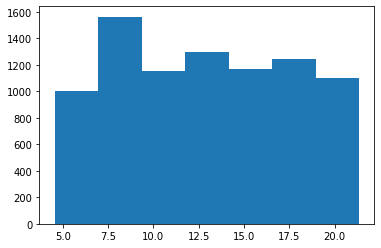

In [23]:
#Se revisará como se comportan los Item_Weight de los datos 
# para ver si se pueden recuperar los 4 faltantes

plt.hist(df['Item_Weight_new'], bins= 7)
df.groupby(by='Item_Weight_new')['Item_Weight_new'].count()

# Los datos están uniformemente distribuidos
#por lo tanto no es recomendable llenar los nulos con el promedio
# se debe buscar alguna similaridad

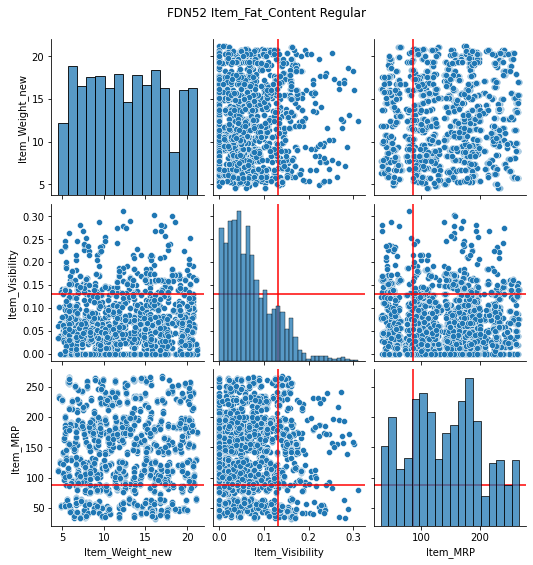

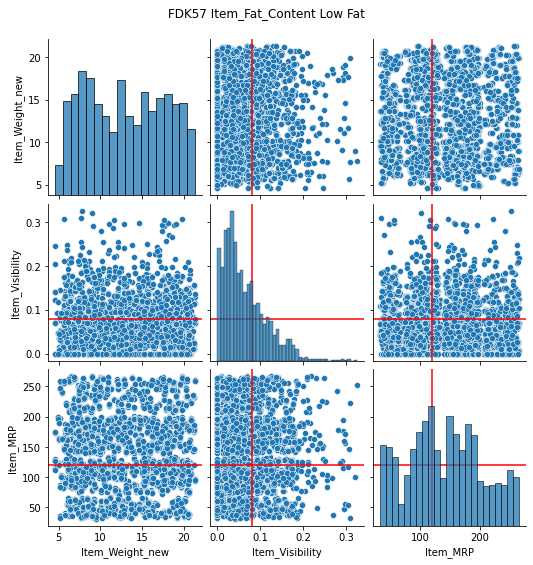

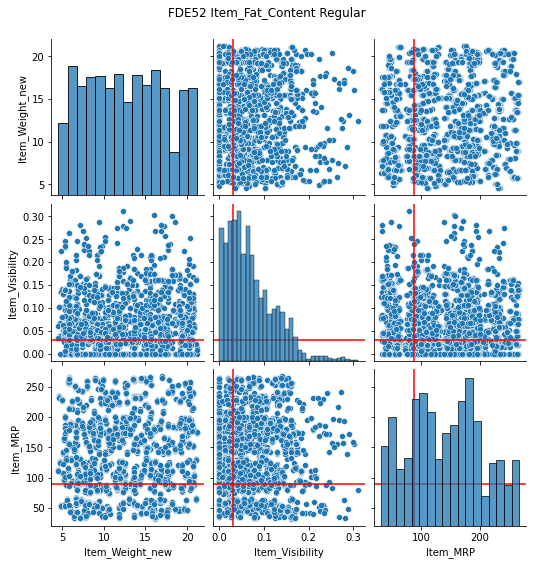

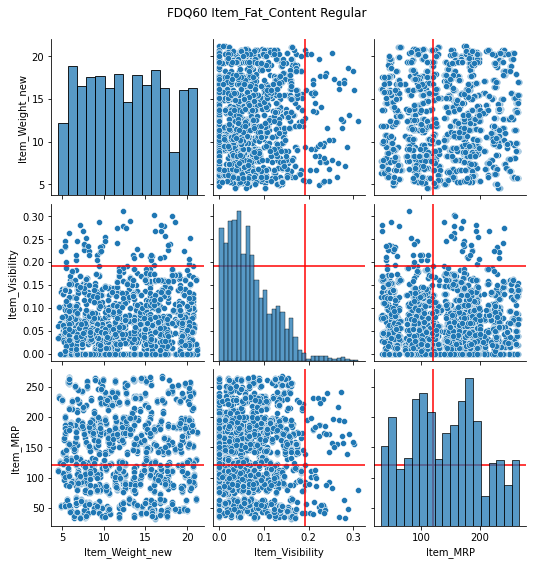

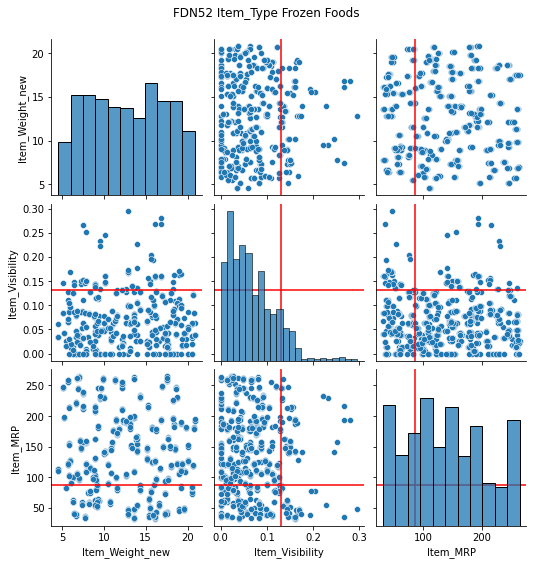

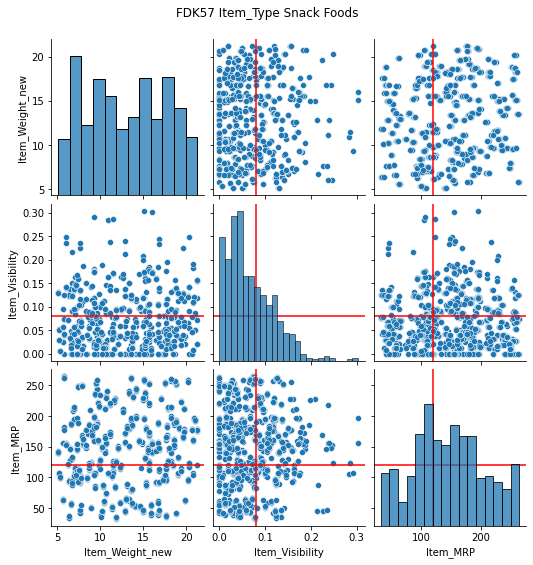

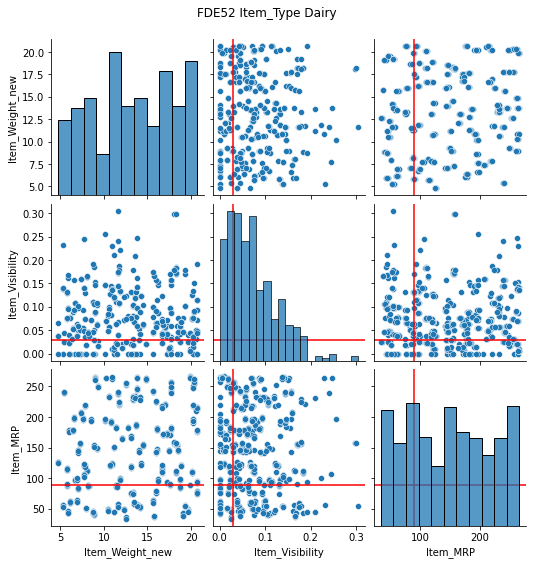

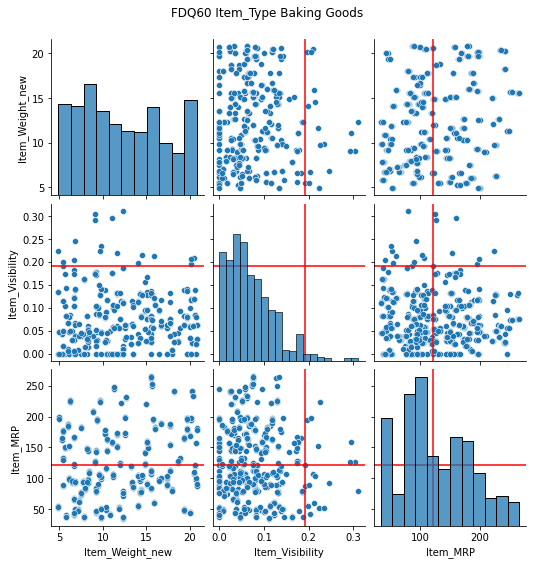

In [24]:
IW_4null = df[df['Item_Identifier'].isin(II_n_null)]


Param = ['Item_Weight_new','Item_Visibility','Item_MRP']

atributos = ['Item_Fat_Content','Item_Type']


for Atr in atributos : 
  for i in IW_4null.index:
          
      g = sns.pairplot(df[df[Atr] == IW_4null.loc[i,Atr]][Param])
      g.fig.suptitle(IW_4null.loc[i,'Item_Identifier'] + ' ' + Atr + ' ' + IW_4null.loc[i,Atr] , y = 1.04)


      for n in range(len(g.axes)):
        g.axes[n,Param.index('Item_Visibility')].axvline(x = IW_4null.loc[i,'Item_Visibility'], color='r')
      for n in range(len(g.axes)):
        g.axes[Param.index('Item_Visibility'),n].axhline(y = IW_4null.loc[i,'Item_Visibility'], color='r')
      

      for n in range(len(g.axes)):
        g.axes[n,Param.index('Item_MRP')].axvline(x = IW_4null.loc[i,'Item_MRP'], color='r')
      for n in range(len(g.axes)):
        g.axes[Param.index('Item_MRP'),n].axhline(y = IW_4null.loc[i,'Item_MRP'], color='r')
    
# Se observa que de acuerdto a los atributos Item_Visibility y Item_MRP el Item_Weight_new no está excesivamente concentrado para ningunp de los atributos 'Item_Fat_Content' y 'Item_Type'
# por lo tanto se puede reemplazar por el promedio

In [25]:
df['Item_Weight_new'].mean()

df['Item_Weight_new'].fillna(df['Item_Weight_new'].mean(), inplace = True)

df.isna().sum()

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
IS_IW_null                      0
Item_Weight_new                 0
Outlet_Size_new                 0
dtype: int64

In [26]:
IW_4null

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales,IS_IW_null,Item_Weight_new,Outlet_Size_new
927,FDN52,NaN,Regular,0.130933,Frozen Foods,86.9198,OUT027,1985,Medium,Tier 3,Supermarket Type3,1569.9564,1,NaN,Medium
1922,FDK57,NaN,Low Fat,0.079904,Snack Foods,120.0440,OUT027,1985,Medium,Tier 3,Supermarket Type3,4434.2280,1,NaN,Medium
4187,FDE52,NaN,Regular,0.029742,Dairy,88.9514,OUT027,1985,Medium,Tier 3,Supermarket Type3,3453.5046,1,NaN,Medium
5022,FDQ60,NaN,Regular,0.191501,Baking Goods,121.2098,OUT019,1985,Small,Tier 1,Grocery Store,120.5098,1,NaN,Small


In [27]:
df['Outlet_Type'].unique()

array(['Supermarket Type1', 'Supermarket Type2', 'Grocery Store',
       'Supermarket Type3'], dtype=object)

In [28]:
'''
Nombre de la variable	      Descripción
Item_Identifier	            Número de identificación único del producto
Item_Weight	                Peso del producto
Item_Fat_Content	          Si el producto es bajo en grasas o regular
Item_Visibility	            El porcentaje de área total de visualización de todos los productos en la tienda asignados a este producto particular
Item_Type	                  La categoría a la que pertenece el producto
Item_MRP	                  Precio Máximo Minorista (precio de lista) del producto
Outlet_Identifier	          Número de identificación único de la tienda
Outlet_Establishment_Year	  El año en el que se estableció la tienda
Outlet_Size	                El tamaño de la tienda en cuanto a la superficie total que cubre
Outlet_Location_Type	      El tipo de área donde se ubica la tienda
Outlet_Type	                Si la tienda es un almacén o algún tipo de supermercado
Item_Outlet_Sales	          Las ventas del producto en la tienda particular. Esta es la variable objetivo que se debe predecir.
'''
df.dtypes

Item_Identifier               object
Item_Weight                  float64
Item_Fat_Content              object
Item_Visibility              float64
Item_Type                     object
Item_MRP                     float64
Outlet_Identifier             object
Outlet_Establishment_Year      int64
Outlet_Size                   object
Outlet_Location_Type          object
Outlet_Type                   object
Item_Outlet_Sales            float64
IS_IW_null                     int64
Item_Weight_new              float64
Outlet_Size_new               object
dtype: object

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:1242: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:1242: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:1242: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memo

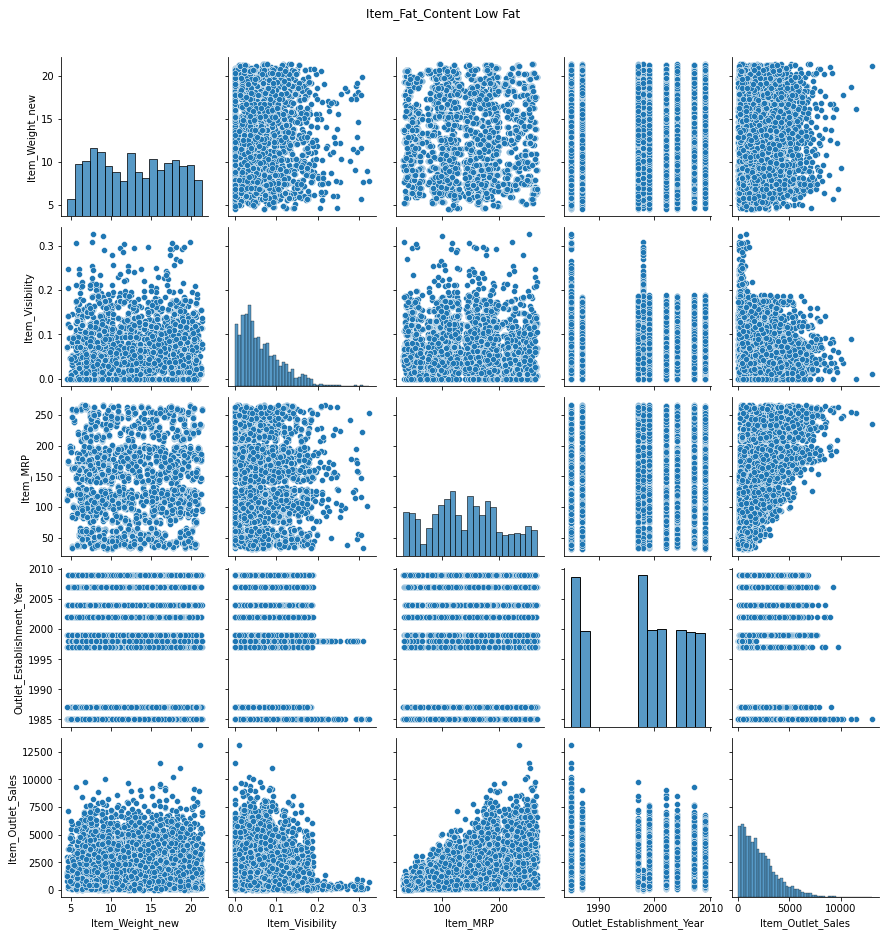

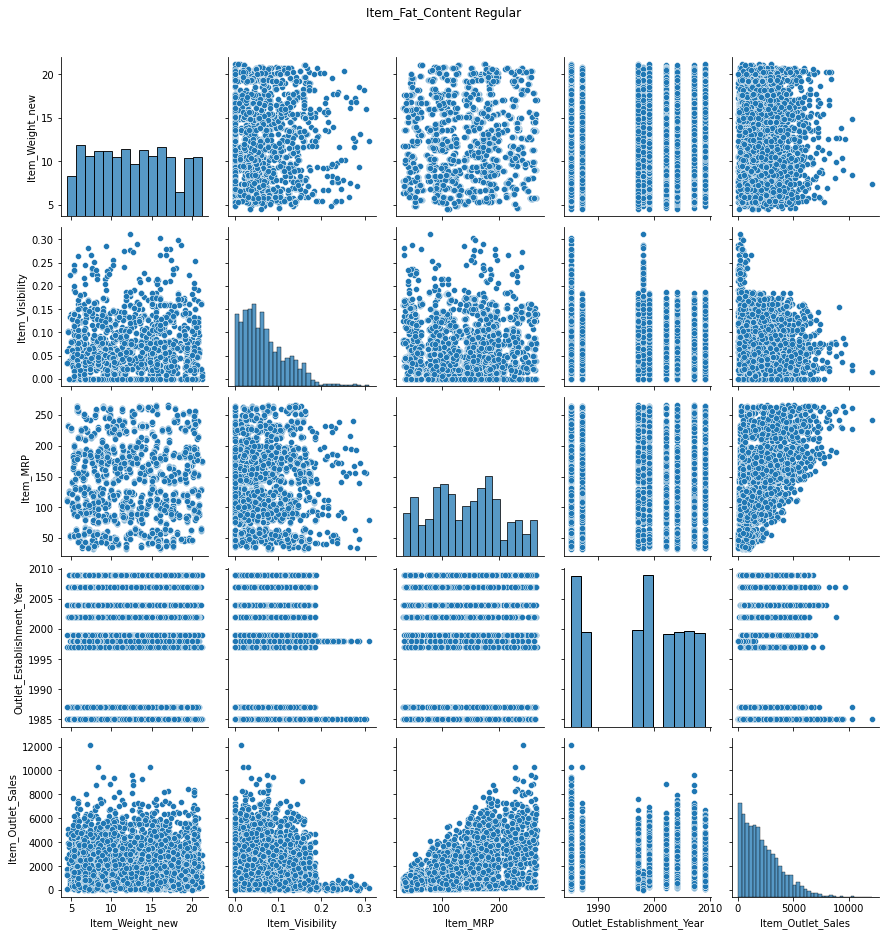

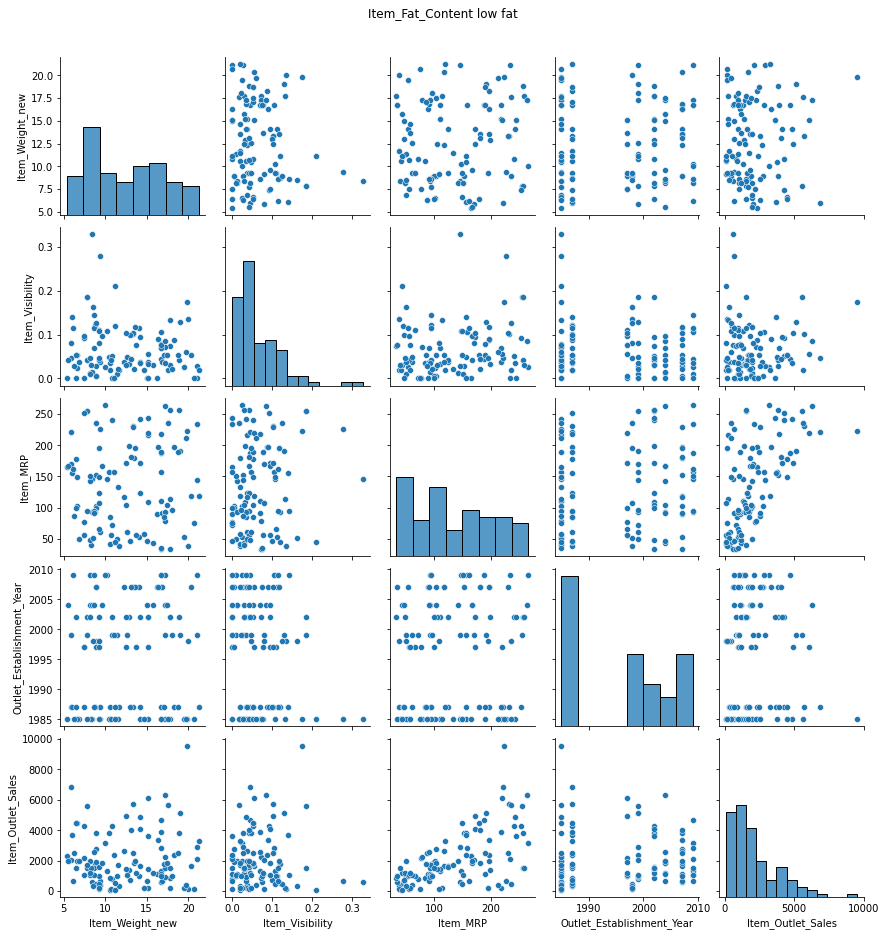

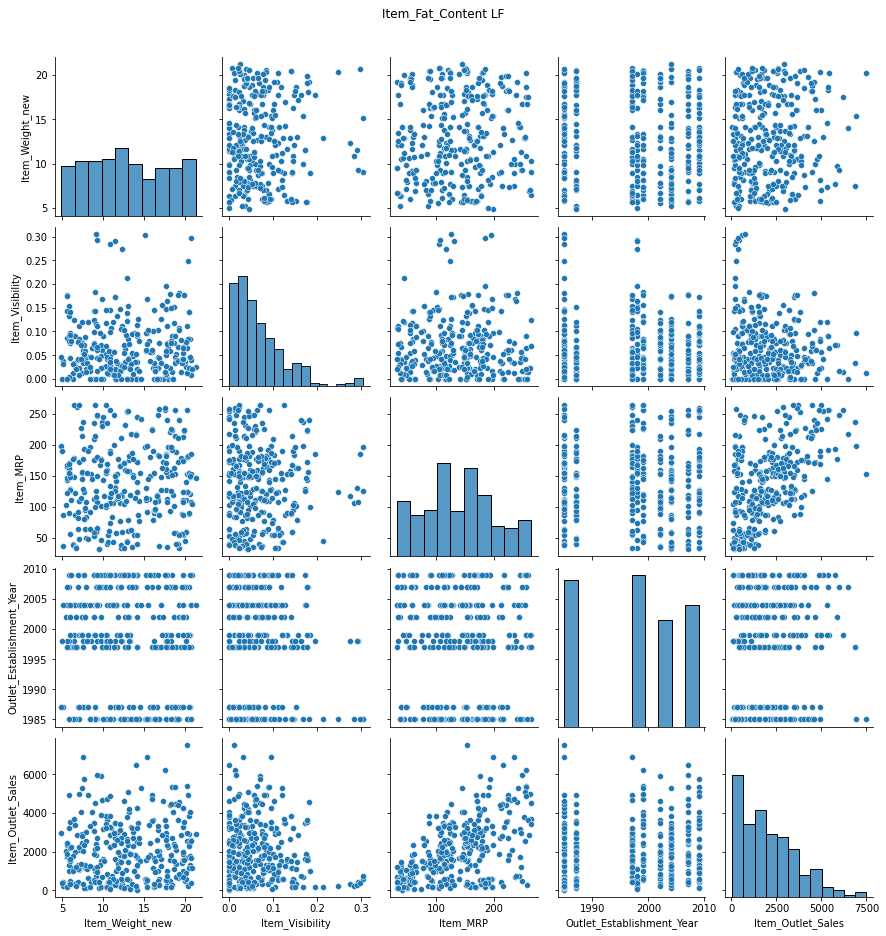

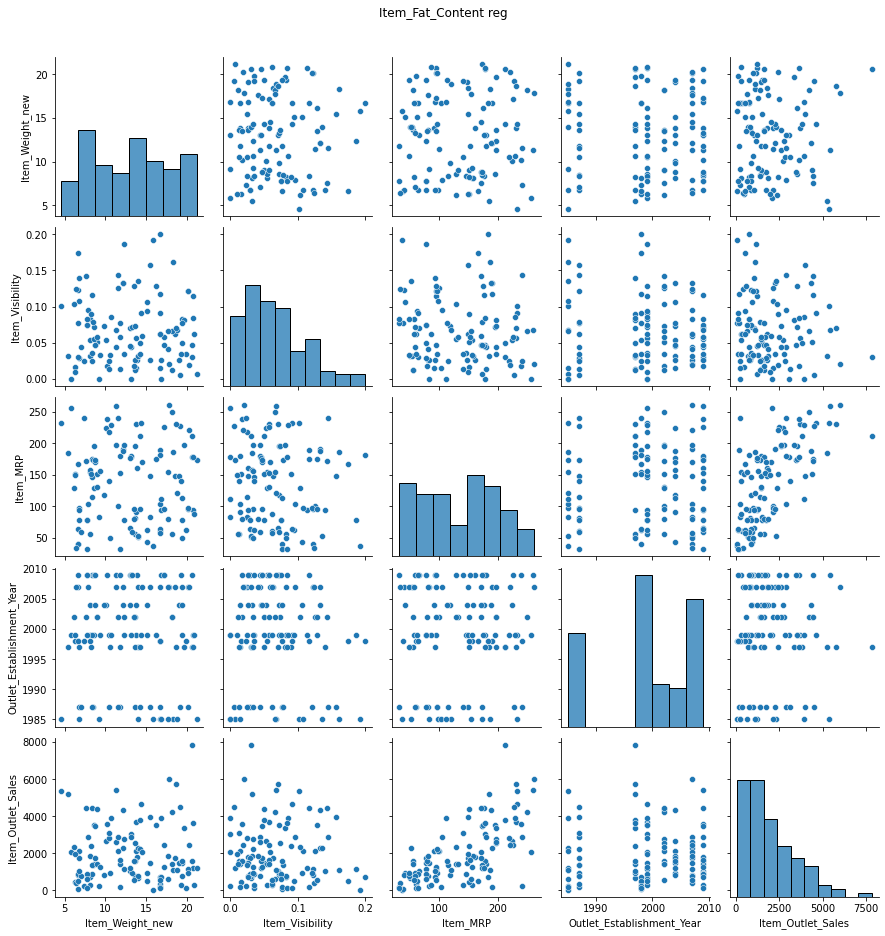

...

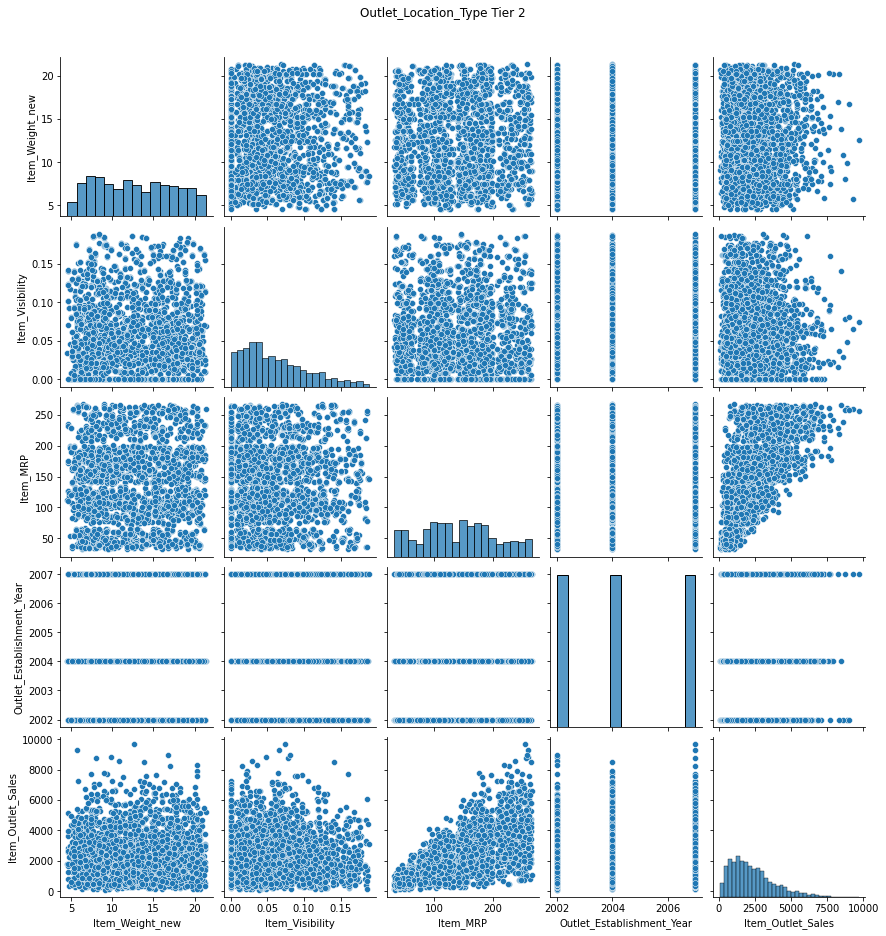

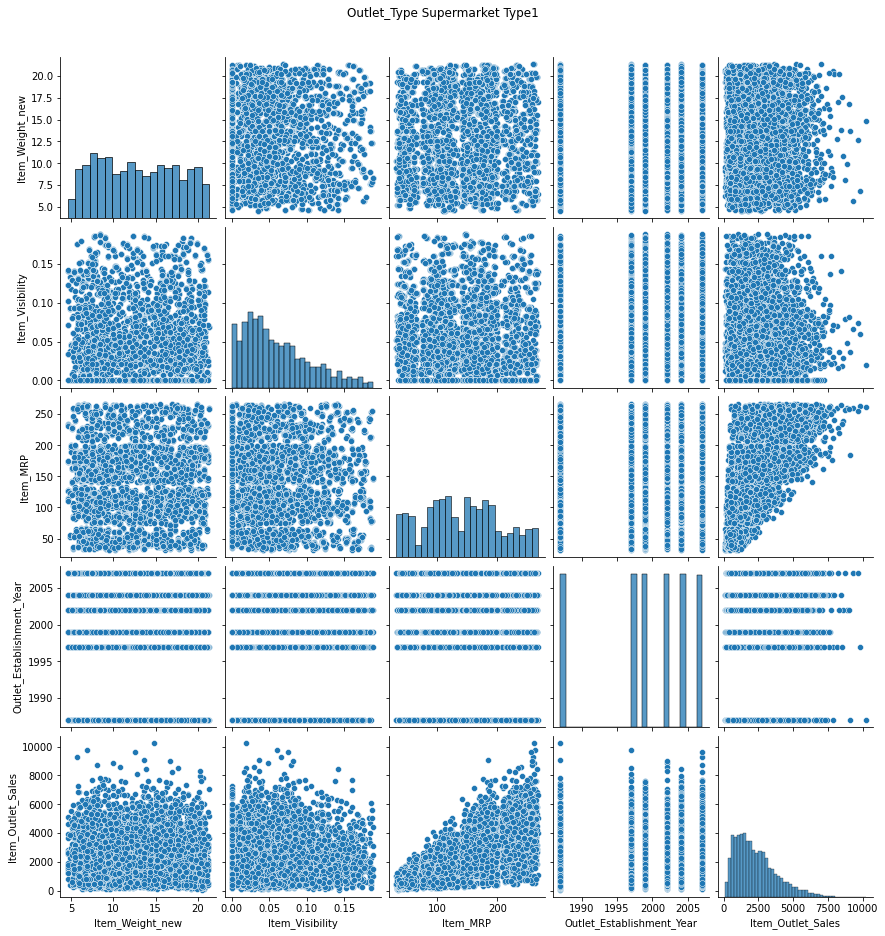

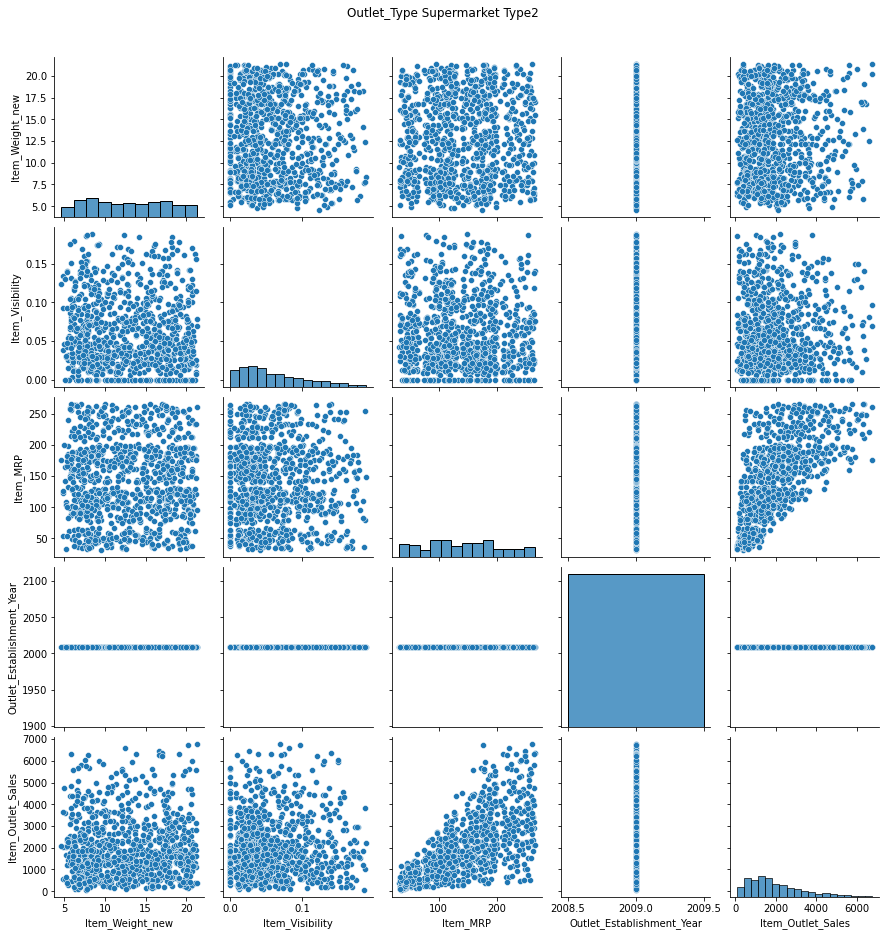

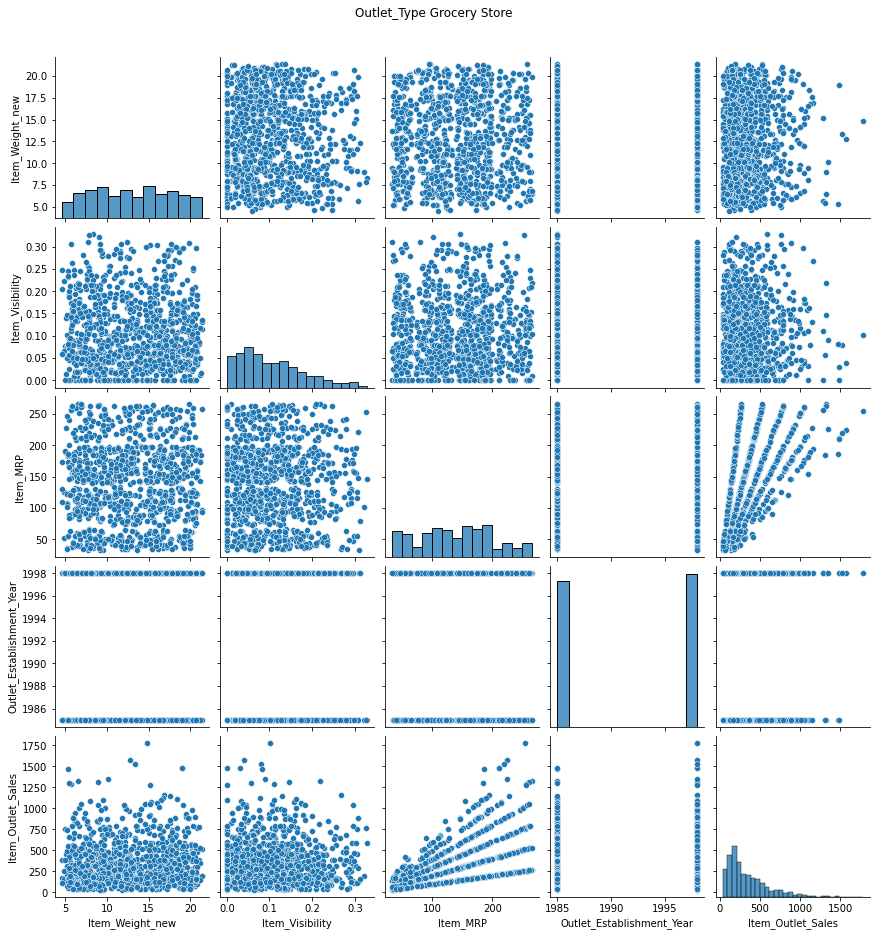

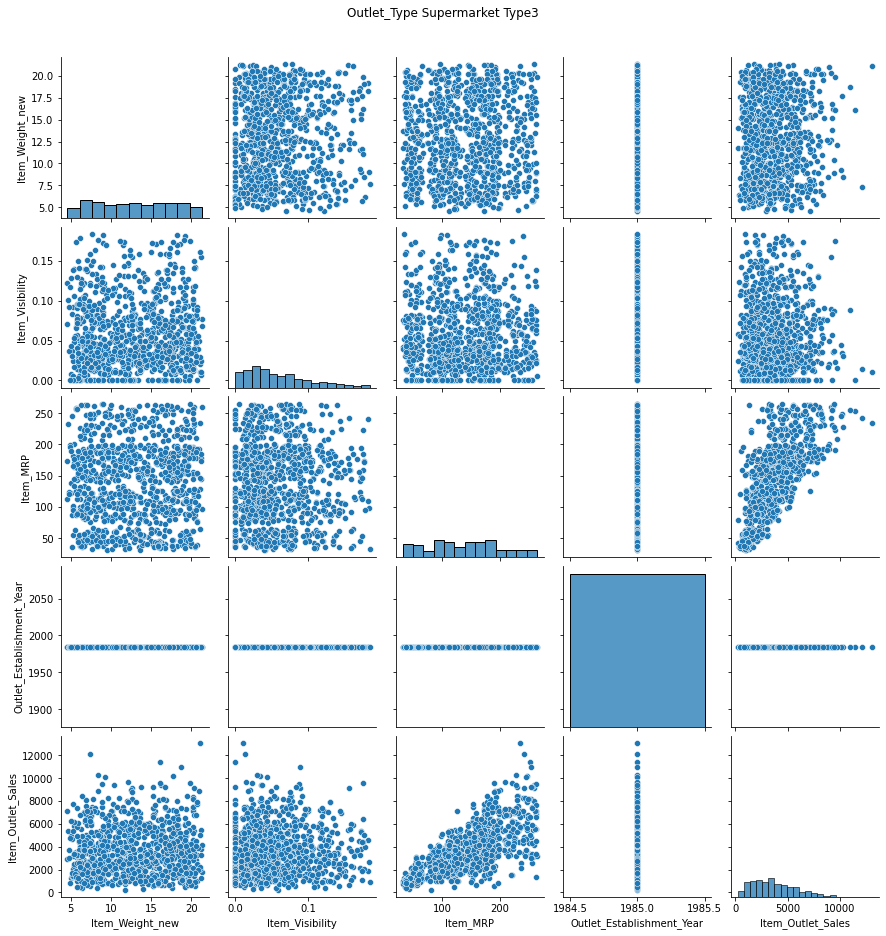

In [29]:

for i in ['Item_Fat_Content','Item_Type','Outlet_Identifier','Outlet_Location_Type','Outlet_Type']:
  for j in df[i].unique():
    df_v = df[df[i] == j][['Item_Weight_new','Item_Visibility','Item_MRP','Outlet_Establishment_Year','Item_Outlet_Sales']]
  #df_v = df[df[n]].loc[:,['Item_Weight_new','Item_Visibility','Item_MRP','Outlet_Establishment_Year']]
    g = sns.pairplot(df_v)
    g.fig.suptitle(i + ' ' + j , y = 1.04)

#De acá se observan algunas distribuciones interesandes como las de Item_MRP vs Item_Outlet_Sales para el OUT019 o las Grocery Store
# Como para los Tier1 se venden muchos mas productos de baja disponibilidad que en otros Tier

#A continuación se ahondará un poco más en estas distribuciones con ayuda de mejores visualizaciones

In [30]:
print(df.groupby(by=['Outlet_Type','Outlet_Identifier'])['Outlet_Type'].count().sort_index)


print(df.groupby(by=['Outlet_Location_Type','Outlet_Type','Outlet_Identifier'])['Outlet_Identifier'].count().sort_index)

<bound method Series.sort_index of Outlet_Type        Outlet_Identifier
Grocery Store      OUT010               555
                   OUT019               528
Supermarket Type1  OUT013               932
                   OUT017               926
                   OUT035               930
                   OUT045               929
                   OUT046               930
                   OUT049               930
Supermarket Type2  OUT018               928
Supermarket Type3  OUT027               935
Name: Outlet_Type, dtype: int64>
<bound method Series.sort_index of Outlet_Location_Type  Outlet_Type        Outlet_Identifier
Tier 1                Grocery Store      OUT019               528
                      Supermarket Type1  OUT046               930
                                         OUT049               930
Tier 2                Supermarket Type1  OUT017               926
                                         OUT035               930
                               

### Se procede a presentar la información en terminos de ventas

In [31]:
by_locType_outType = df.groupby(by = ['Outlet_Location_Type','Outlet_Type'])['Item_Outlet_Sales'].sum()
by_loc_type_item = df.groupby(by = ['Item_Type','Outlet_Location_Type','Outlet_Type'])['Item_Outlet_Sales'].sum()
#by_loc_type_item = df.groupby(by = ['Outlet_Location_Type','Item_Type'])['Item_Outlet_Sales'].sum().sort_values(ascending=False)
#by_locType_outType = by_locType_outType.to_frame()

by_locType_outType = by_locType_outType.to_frame().reset_index()
by_loc_type_item = by_loc_type_item.to_frame().reset_index()

#by_locType_outType = by_locType_outType.unstack().reset_index()
#by_locType_outType

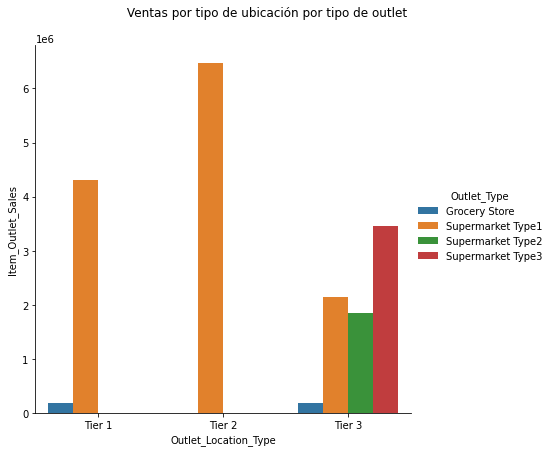

In [32]:
g = sns.catplot(x="Outlet_Location_Type", y="Item_Outlet_Sales",
                hue="Outlet_Type",
                data=by_locType_outType, kind="bar",
                height=6, aspect=1);

g.fig.suptitle(' Ventas por tipo de ubicación por tipo de outlet ' , y = 1.04);

Del siguiente cuadro se destaca como Tier3 es el que más vende, siendo el Supermarket Type3 el que mayor aporta

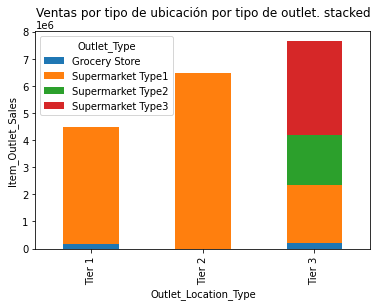

In [33]:
aux = by_locType_outType.pivot(index='Outlet_Location_Type', columns = 'Outlet_Type', values = 'Item_Outlet_Sales').reset_index()
aux.plot(x='Outlet_Location_Type', kind = 'bar', stacked=True)
plt.ylabel('Item_Outlet_Sales');
plt.title('Ventas por tipo de ubicación por tipo de outlet. stacked' , y = 1.04);

De los siguientes gráficos se observa que los items más vendidos son "Fruits and vegetables" y "Snack Foods".
Además se peude observar la participación que tiene cada Tier y tipo de outlet en la venta de cada uno

Text(0.5, 1.0, 'Ventas totales pot tipo de item')

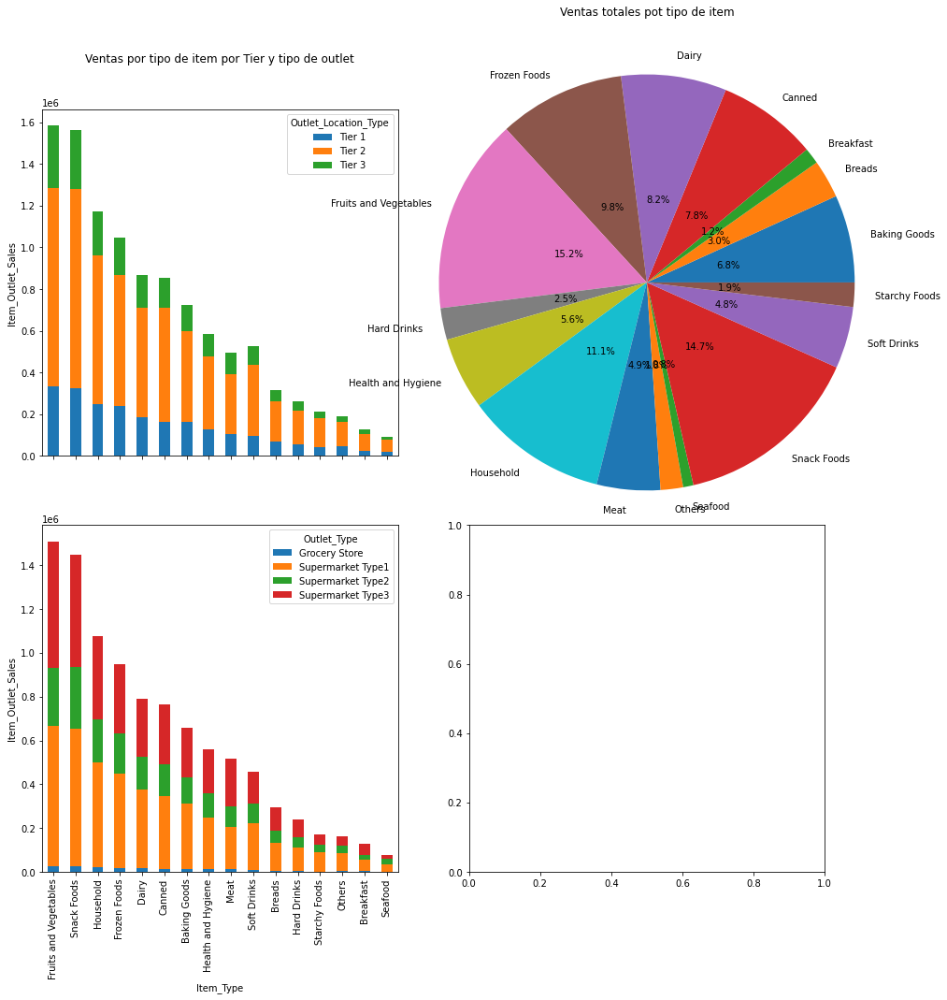

In [58]:

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(15,15))

aux = df.groupby('Item_Type')['Item_Outlet_Sales'].sum()

ax[0,1].pie(aux, labels = aux.index, autopct='%1.1f%%', pctdistance=0.4, radius=1.5)

aux = by_loc_type_item.pivot_table(index='Item_Type', columns= 'Outlet_Location_Type' , values = 'Item_Outlet_Sales', margins=True).sort_values(by = 'All', ascending=False).drop('All', axis=1).drop('All').reset_index()
aux.plot(x='Item_Type', kind = 'bar', stacked=True, ax = ax[0,0])
ax[0,0].set_ylabel('Item_Outlet_Sales');


ax[0,0].get_shared_x_axes().join(ax[0,0], ax[1,0])


#ax[2] = plt.subplot(312,sharex = ax[1])
aux = by_loc_type_item.pivot_table(index='Item_Type', columns= 'Outlet_Type' , values = 'Item_Outlet_Sales', margins=True).sort_values(by = 'All', ascending=False).drop('All', axis=1).drop('All').reset_index()
aux.plot(x='Item_Type', kind = 'bar', stacked=True, ax = ax[1,0])
ax[1,0].set_ylabel('Item_Outlet_Sales')

#fig.suptitle('Ventas por tipo de item por Tier y tipo de outlet');
ax[0,0].set_title('Ventas por tipo de item por Tier y tipo de outlet', pad = 50)
ax[0,1].set_title('Ventas totales pot tipo de item', pad = 100)

Del siguiente gráfico se puede apreciar como Supermarket type 1 aporta más, incluso comparado con Tier 3 completo (interesante)

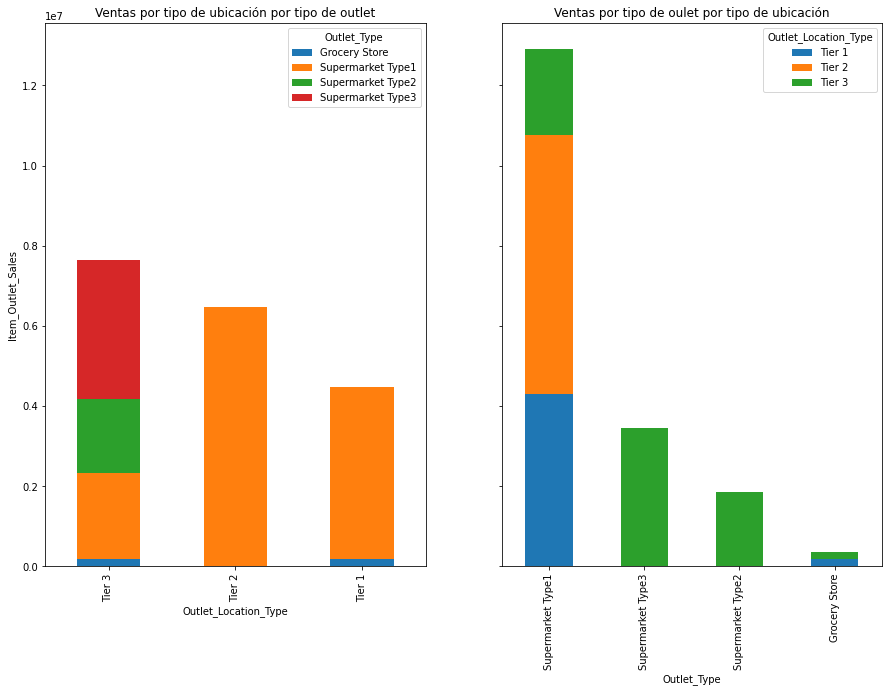

In [35]:
fig, ax = plt.subplots(nrows=1, ncols=2, sharey= True, figsize=(15,10))

by_outlet_type = df.groupby(by = ['Outlet_Type','Outlet_Location_Type'])['Item_Outlet_Sales'].sum()
aux0= by_outlet_type.to_frame().reset_index()
aux1 = aux0.pivot_table(index='Outlet_Location_Type', columns='Outlet_Type', values ='Item_Outlet_Sales' , margins=True, aggfunc = np.sum).sort_values(by = 'All', ascending=False).drop('All', axis=1).drop('All').reset_index()

aux1.plot(x='Outlet_Location_Type', kind= 'bar', ax = ax[0], stacked = True)
ax[0].set_ylabel('Item_Outlet_Sales')



aux2 = aux0.pivot_table(index='Outlet_Type', columns='Outlet_Location_Type', values ='Item_Outlet_Sales' , margins=True, aggfunc = np.sum).sort_values(by = 'All', ascending=False).drop('All', axis=1).drop('All').reset_index()
aux2.plot(x='Outlet_Type', kind= 'bar', ax = ax[1], stacked = True)

ax[0].set_title('Ventas por tipo de ubicación por tipo de outlet');
ax[1].set_title('Ventas por tipo de oulet por tipo de ubicación');


Del siguiente gráfico se puede observar como Supermarket vende más de todos los items y se puede comparar de manera sencialla con los demás tipos por produco

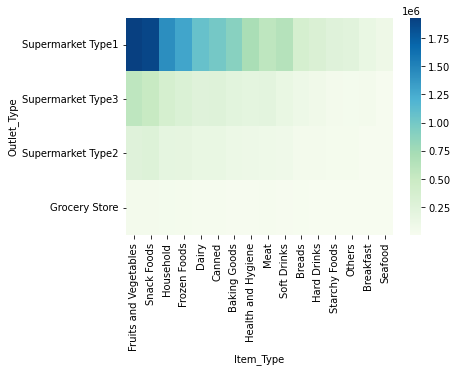

In [36]:
by_rmp_type= df.groupby(by = ['Item_MRP','Outlet_Type'])['Item_Outlet_Sales'].sum()

#hm = pd.DataFrame(df['Item_Outlet_Sales'], index = df['Outlet_Type'], columns = df['Outlet_Location_Type'])

#df[['Outlet_Type','Item_Outlet_Sales','Outlet_Location_Type']].pivot_table(index='Outlet_Type', columns='Item_Outlet_Sales', values='Item_Outlet_Sales', agg = sum)
aux = df[['Outlet_Type','Item_Outlet_Sales','Item_Type']]

aux = aux.pivot_table(index='Outlet_Type',columns='Item_Type', values= 'Item_Outlet_Sales', aggfunc = np.sum, margins=True ).sort_values('All', ascending=False).drop('All', axis=1).sort_values('All', ascending=False, axis=1).drop('All')

#(aux)

sns.heatmap(aux, cmap='GnBu')